# 03_per_store_forecast
Loop through each Store to train Prophet with holiday effects. Saves per-store plots and metrics.

Added project root to sys.path: C:\Projects\hypermarket-holiday-forecast


20:42:52 - cmdstanpy - INFO - Chain [1] start processing
20:42:52 - cmdstanpy - INFO - Chain [1] done processing
20:42:53 - cmdstanpy - INFO - Chain [1] start processing
20:42:53 - cmdstanpy - INFO - Chain [1] done processing
20:42:54 - cmdstanpy - INFO - Chain [1] start processing
20:42:54 - cmdstanpy - INFO - Chain [1] done processing
20:42:55 - cmdstanpy - INFO - Chain [1] start processing
20:42:55 - cmdstanpy - INFO - Chain [1] done processing
20:42:56 - cmdstanpy - INFO - Chain [1] start processing
20:42:56 - cmdstanpy - INFO - Chain [1] done processing
20:42:57 - cmdstanpy - INFO - Chain [1] start processing
20:42:57 - cmdstanpy - INFO - Chain [1] done processing
20:42:58 - cmdstanpy - INFO - Chain [1] start processing
20:42:59 - cmdstanpy - INFO - Chain [1] done processing
20:43:00 - cmdstanpy - INFO - Chain [1] start processing
20:43:00 - cmdstanpy - INFO - Chain [1] done processing
20:43:01 - cmdstanpy - INFO - Chain [1] start processing
20:43:01 - cmdstanpy - INFO - Chain [1]

Saved per-store outputs to figures/ and reports/


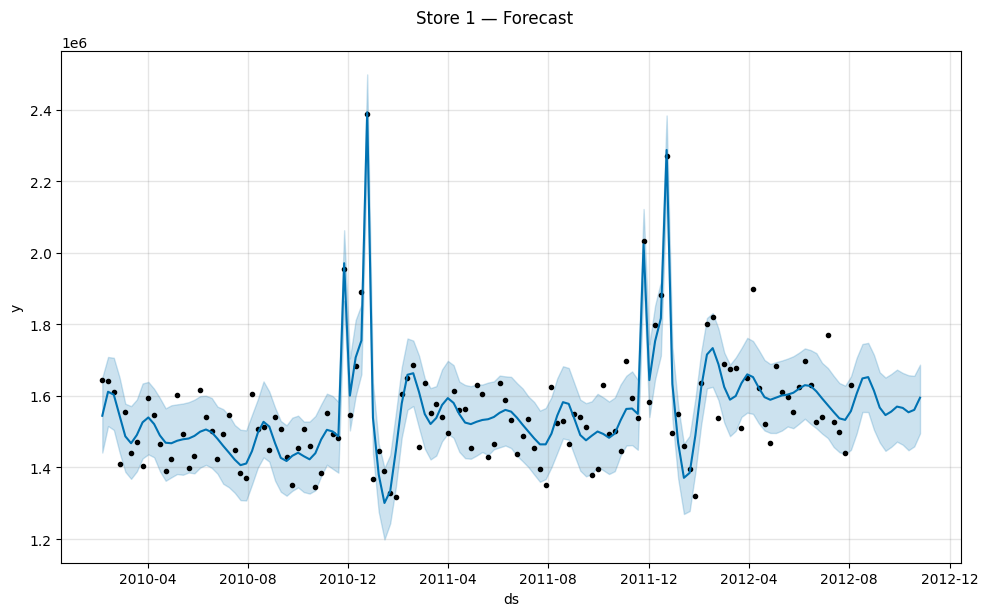

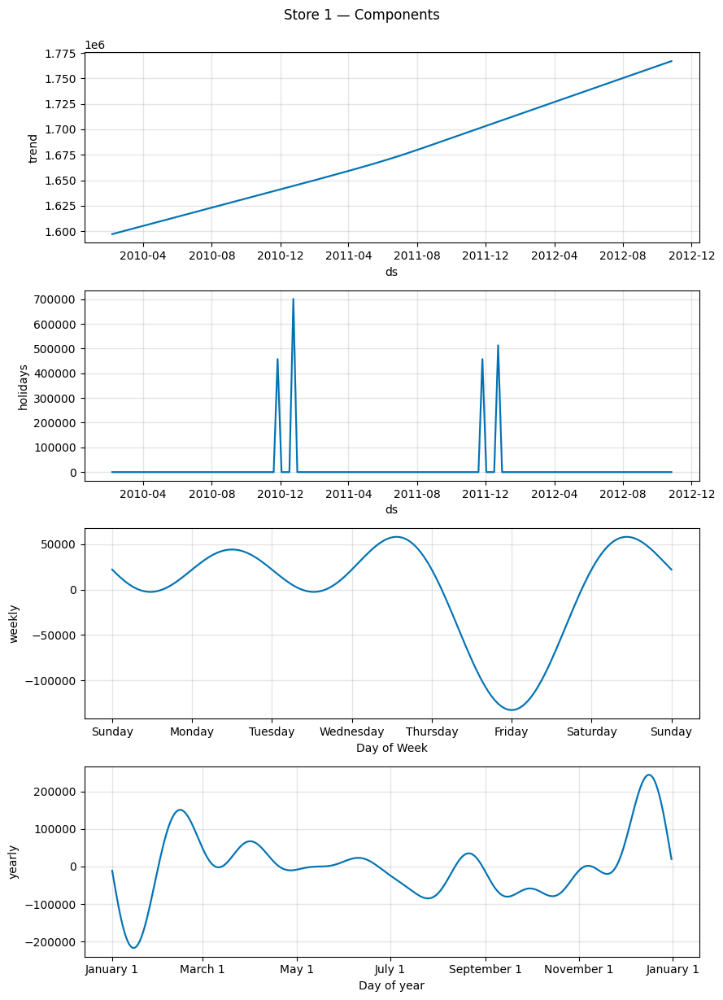

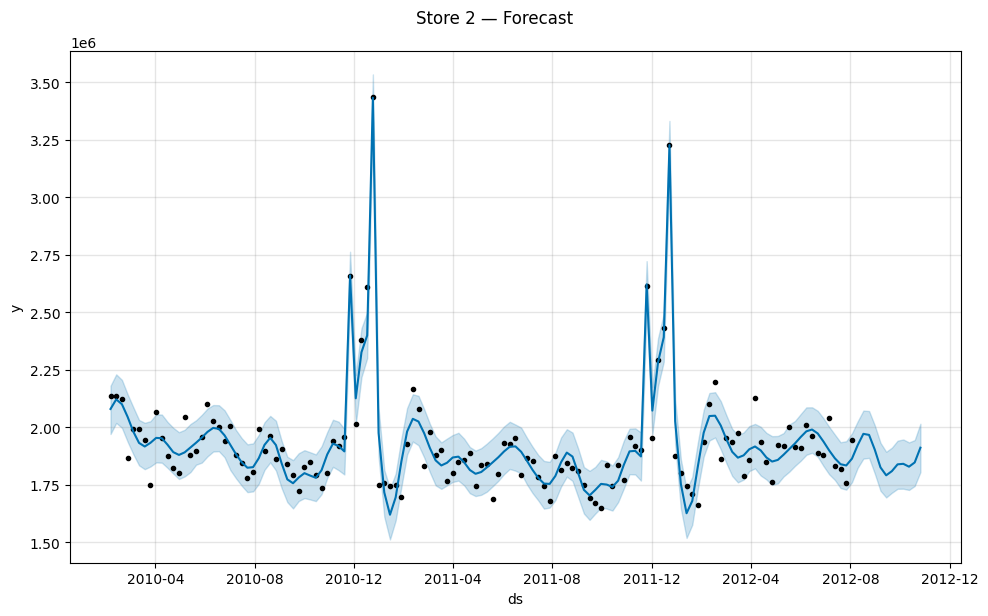

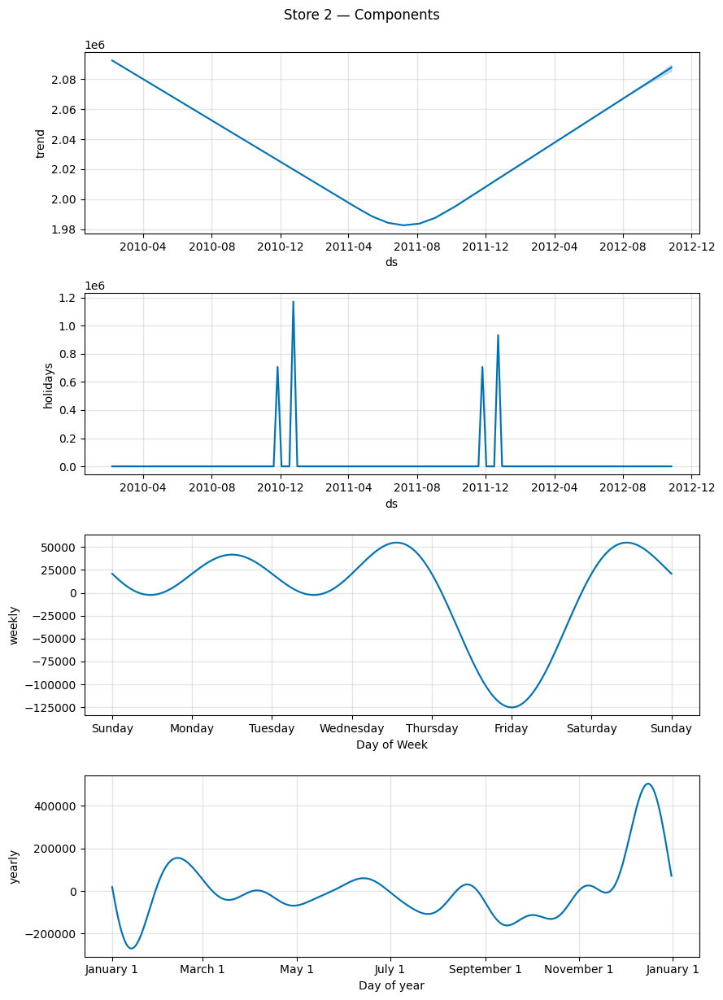

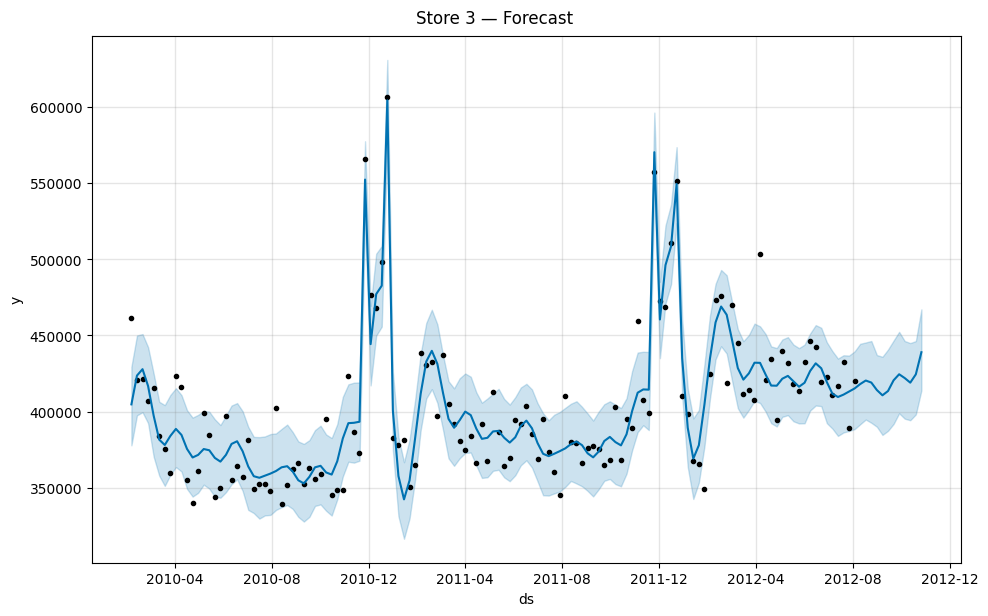

...

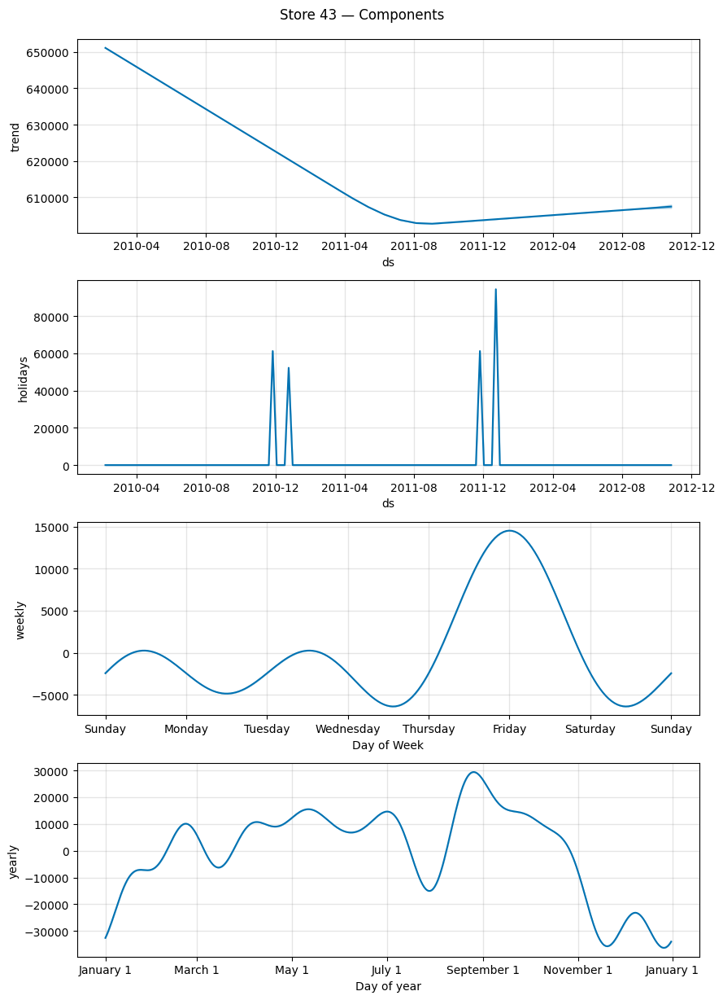

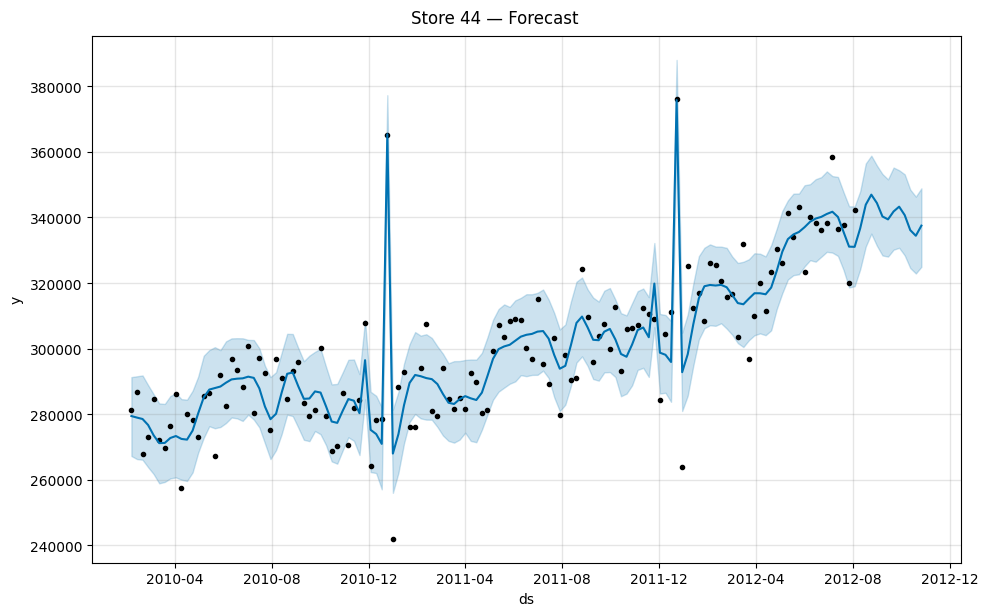

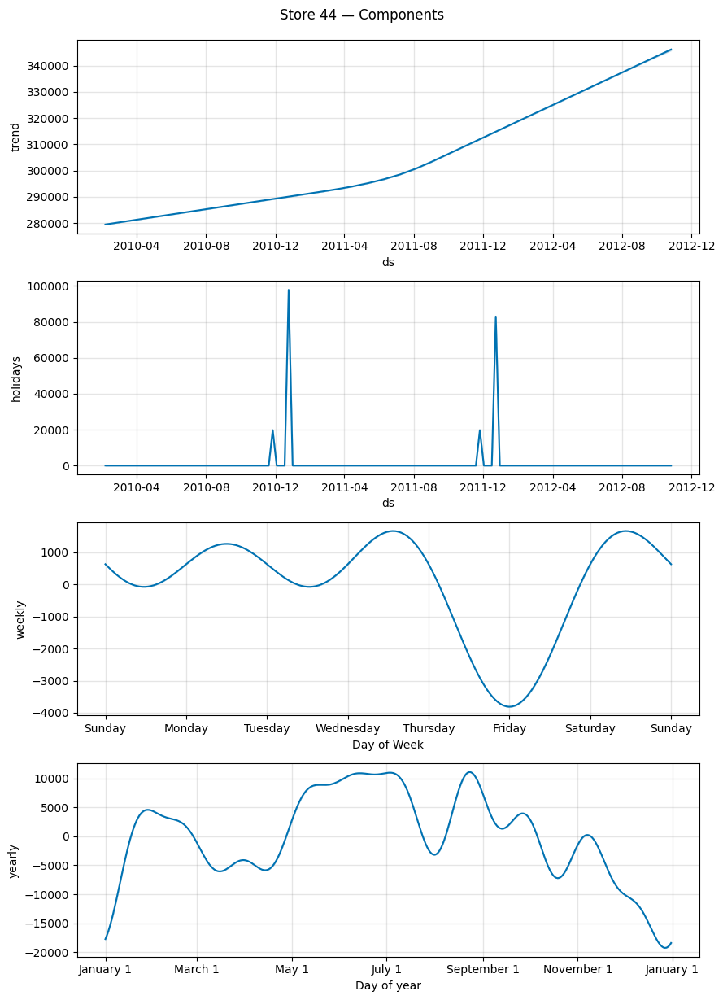

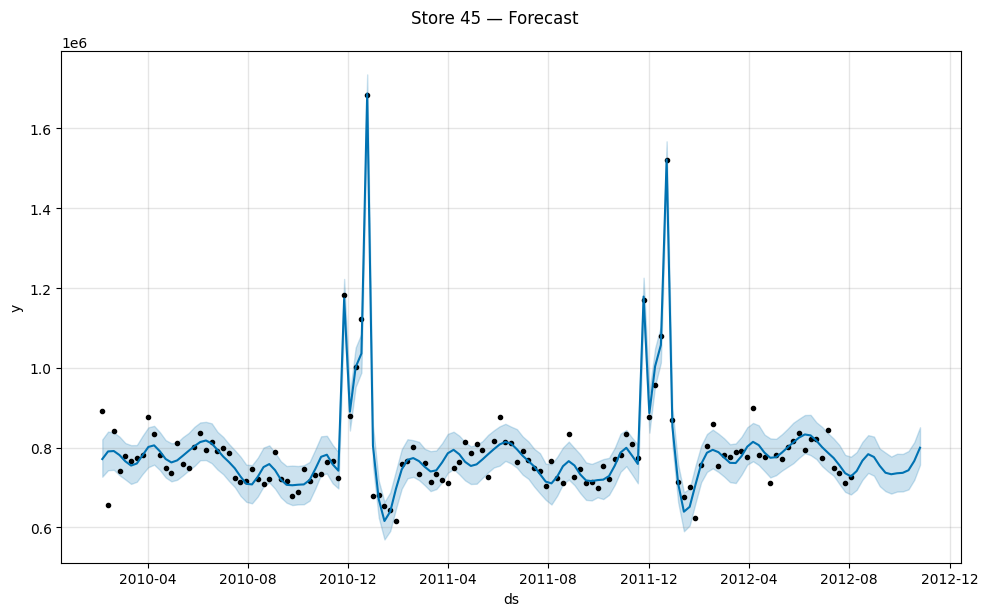

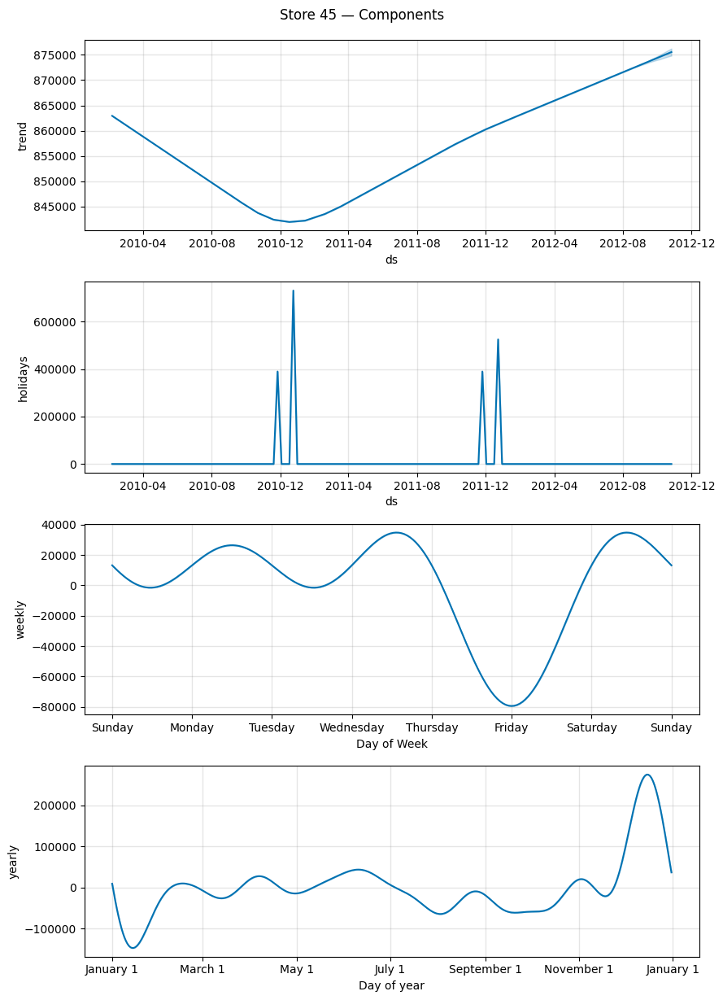

In [1]:
import sys, os
sys.path.append(os.path.abspath('..'))
print('Added project root to sys.path:', os.path.abspath('..'))
import pandas as pd
from pathlib import Path
from prophet import Prophet
from src.holidays_us import build_holidays
from src.train import evaluate
ROOT = Path('..').resolve()
DATA_DIR = ROOT / 'data' / 'raw'
FIG_ROOT = ROOT / 'figures'
REP_ROOT = ROOT / 'reports'
FIG_ROOT.mkdir(parents=True, exist_ok=True)
REP_ROOT.mkdir(parents=True, exist_ok=True)
df = pd.read_csv(DATA_DIR / 'train.csv')
assert {'Store','Date','Weekly_Sales'} <= set(df.columns)
df['Date'] = pd.to_datetime(df['Date'])
HOLDOUT = 12
summary = []
for store_id, g in df.groupby('Store'):
    ts = (g.groupby('Date', as_index=False)['Weekly_Sales']
            .sum().sort_values('Date')
            .rename(columns={'Date':'ds','Weekly_Sales':'y'}))
    if len(ts) <= HOLDOUT + 8:
        print(f'Skipping store {store_id}: {len(ts)} rows')
        continue
    train_ts = ts.iloc[:-HOLDOUT].copy()
    valid_ts = ts.iloc[-HOLDOUT:].copy()
    holidays = build_holidays(int(train_ts['ds'].dt.year.min()), int(train_ts['ds'].dt.year.max()))
    m = Prophet(holidays=holidays, weekly_seasonality=True, yearly_seasonality=True, daily_seasonality=False)
    m.fit(train_ts)
    future = m.make_future_dataframe(periods=HOLDOUT, freq='W-FRI')
    fc = m.predict(future)
    pred_valid = fc.set_index('ds').loc[valid_ts['ds']][['yhat']].reset_index()
    metrics = evaluate(valid_ts['y'].values, pred_valid['yhat'].values)
    sfig = FIG_ROOT / f'store_{store_id}'; srep = REP_ROOT / f'store_{store_id}'
    sfig.mkdir(parents=True, exist_ok=True); srep.mkdir(parents=True, exist_ok=True)
    fig1 = m.plot(fc); fig1.suptitle(f'Store {store_id} — Forecast', y=1.02)
    fig1.savefig(sfig / 'prophet_forecast.png', bbox_inches='tight')
    fig2 = m.plot_components(fc); fig2.suptitle(f'Store {store_id} — Components', y=1.02)
    fig2.savefig(sfig / 'prophet_components.png', bbox_inches='tight')
    fc[['ds','yhat','yhat_lower','yhat_upper']].to_csv(srep / 'forecast.csv', index=False)
    pd.DataFrame([metrics]).to_csv(srep / 'metrics.csv', index=False)
    summary.append({'Store': store_id, **metrics})
import pandas as pd
pd.DataFrame(summary).sort_values('RMSE').to_csv(REP_ROOT / 'per_store_metrics_summary.csv', index=False)
print('Saved per-store outputs to figures/ and reports/')
